In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from sklearn.metrics import classification_report, confusion_matrix,precision_recall_curve, auc,f1_score, make_scorer
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
# from xgboost import XGBClassifier
from sklearn.metrics import average_precision_score
from bayes_opt import BayesianOptimization
from sklearn.preprocessing import StandardScaler
from scipy.stats import loguniform
from multiprocessing import cpu_count
from skopt import BayesSearchCV
import warnings
warnings.filterwarnings("ignore")

In [4]:
data=pd.read_csv("my_paypal_creditcard.csv")
data

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


# Data Exploration

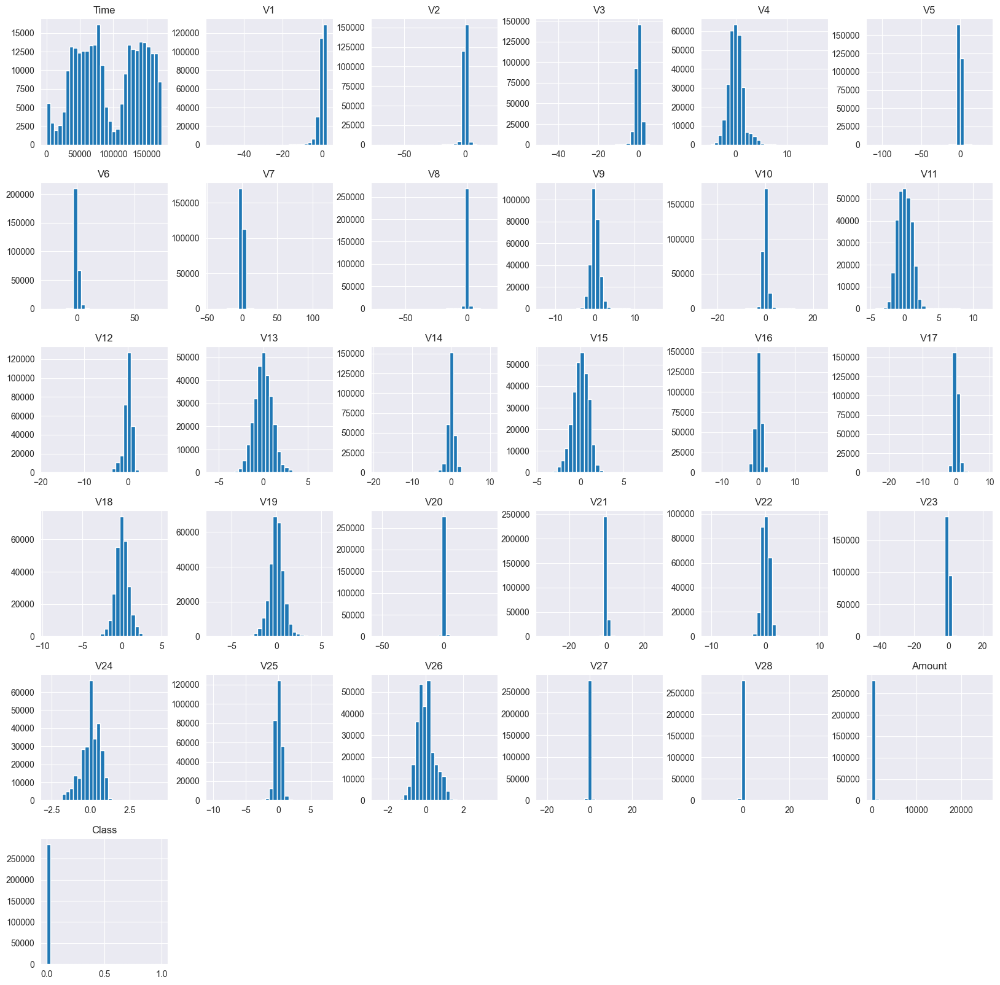

In [3]:
def plot_histogram(dataset, bins, size=(5, 5)):
    sns.set_style("darkgrid")
    plot = dataset.hist(bins=bins, figsize=size)
    plt.title("Distribution of Each Variable")
    plt.show()
    
plot_histogram(data, 30, size=(20,20))

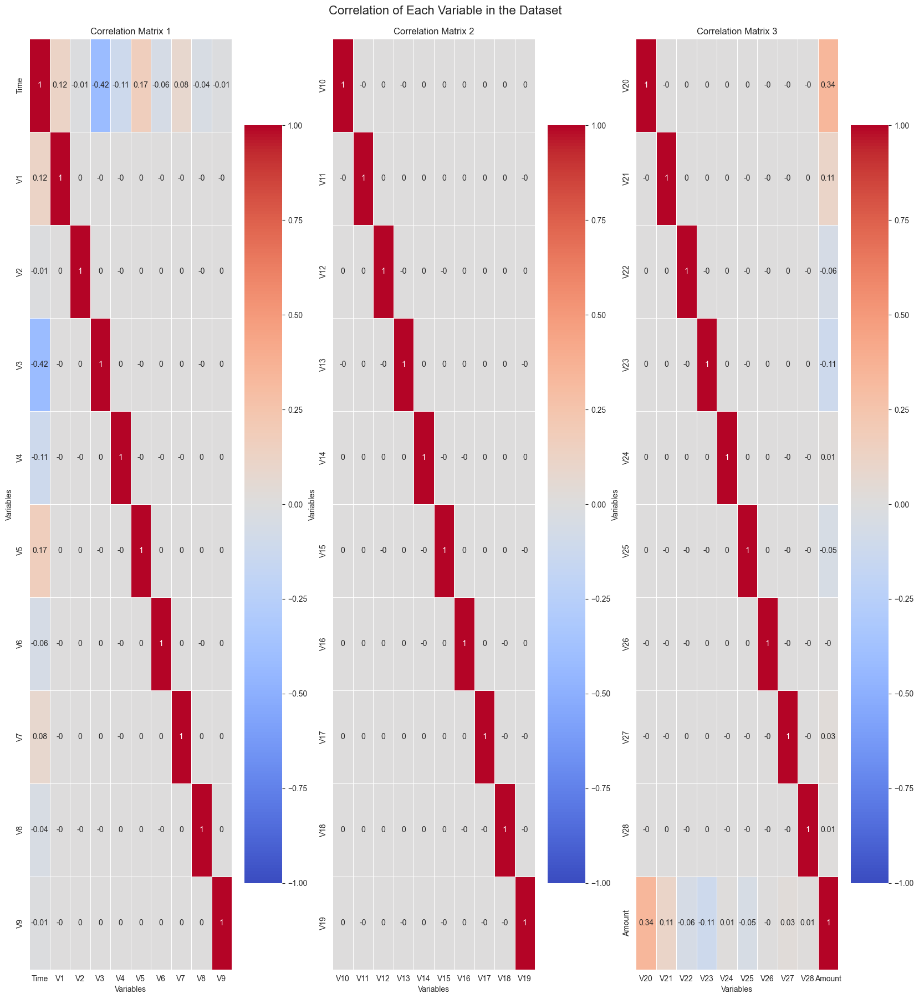

In [4]:
def plot_correlation_matrix(dataset):
    fig, axes = plt.subplots(1, 3, figsize=(20, 20))
    correlation_matrices = [dataset.corr().iloc[i*10:(i+1)*10, i*10:(i+1)*10].round(2) for i in range(3)]

    for i, ax in enumerate(axes):
        sns.heatmap(correlation_matrices[i], annot=True, cmap='coolwarm', linewidths=0.7, vmin=-1, vmax=1, fmt='.2g', ax=ax)
        ax.set_title(f"Correlation Matrix {i+1}")
        ax.set_xlabel("Variables")
        ax.set_ylabel("Variables")

    fig.suptitle("Correlation of Each Variable in the Dataset", fontsize=16)
    fig.subplots_adjust(top=0.95)
    plt.show()


plot_correlation_matrix(data)

# Data Visualization

In [6]:
cls=data.Class.value_counts().reset_index()
cls.rename(columns={"Class":"No of instances", "index":"Class"}, inplace=True)
cls.replace(to_replace=[0, 1],value=["Not Fraud","Fraud"], inplace=True)
cls

,Class,No of instances
0,Not Fraud,284315
1,Fraud,492


In [7]:
def plot_class_instances(cls):
    fig = px.bar(
        cls, x='Class', y='No of instances', text='No of instances',
        color='Class', title="Number of Instances for Each Class",
        template='presentation'
    )
    fig.show()
plot_class_instances(cls)

In [8]:
not_fraud_class = data[data["Class"] == 0]
fraud_class = data[data["Class"] == 1]

In [9]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create subplots with shared x-axis
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, x_title="Transaction Amount", y_title="Count")
fig.add_trace(go.Histogram(x=fraud_class.Amount, name='Frauds'), row=1, col=1)
fig.add_trace(go.Histogram(x=not_fraud_class.Amount, name='Non-Frauds'), row=2, col=1)
fig.update_layout(title='Fraud Transaction Amount Vs Non-Frauds Transaction Amount', height=800, width=800, template="presentation")
fig.update_xaxes(range=[0, 6000], row=1, showticklabels=True)
fig.update_xaxes(range=[0, 6000], row=2, showticklabels=True)
fig.show()


In [10]:
t1 = data[(data['Time'] <= 86400) & (data['Class'] == 0)]
t1['Time'] = t1['Time'].apply(lambda x: round(x / 3600, 2))

# First day frauds
t2 = data[(data['Time'] <= 86400) & (data['Class'] == 1)]
t2['Time'] = t2['Time'].apply(lambda x: round(x / 3600, 2))

# Second day no frauds
t3 = data[(data['Time'] > 86400) & (data['Class'] == 0)]
t3['Time'] = t3['Time'].apply(lambda x: round(x / 3600, 2) - 24.00)

# Second day frauds
t4 = data[(data['Time'] > 86400) & (data['Class'] == 1)]
t4['Time'] = t4['Time'].apply(lambda x: round(x / 3600, 2) - 24.00)

fig = make_subplots(rows=2, cols=2, subplot_titles=["1st day, No Frauds", "1st day, Frauds", "2nd day, No Frauds", "2nd day, Frauds"],
                    x_title="Time of Transaction", y_title="Count")

# Add traces to the subplots
fig.add_trace(go.Histogram(x=t1['Time'], name='1st day, No Frauds'), row=1, col=1)
fig.add_trace(go.Histogram(x=t2['Time'], name='1st day, Frauds'), row=1, col=2)
fig.add_trace(go.Histogram(x=t3['Time'], name='2nd day, No Frauds'), row=2, col=1)
fig.add_trace(go.Histogram(x=t4['Time'], name='2nd day, Frauds'), row=2, col=2)

fig.update_layout(title='Fraud Transaction Times Vs Non-Frauds Transaction Time', height=800, width=800, template="presentation")


fig.show()

In [10]:
def scaler(data):
    scaler = StandardScaler()
    df_copy = data.copy()
    df_copy['Time'] = scaler.fit_transform(df_copy['Time'].to_numpy().reshape(-1, 1))
    df_copy['Amount'] = scaler.fit_transform(df_copy['Amount'].to_numpy().reshape(-1, 1))
    return df_copy

df = scaler(data)
df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-1.996583,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0.244964,0
1,-1.996583,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,-0.342475,0
2,-1.996562,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,1.160686,0
3,-1.996562,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.140534,0
4,-1.996541,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,-0.073403,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,1.641931,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,-0.350151,0
284803,1.641952,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,-0.254117,0
284804,1.641974,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,-0.081839,0
284805,1.641974,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,-0.313249,0


# Machine Learning 

Since we have columns V1 - V28 as PCA values and have imbalanced dataset, we are going to make use of the following processes

we are going to make use of the various methods
1. Standard Scaler
2. UnderSampling 
3. OverSampling
4. SMOTE
5. NearMiss 

before that, we will have to split the data into traing and testing data.

In [11]:
X = data.drop(columns=['Time', 'Class'])
y = data['Class']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Printing the dimensions of the training and testing datasets
print(f"""
1. The Training dataset has dimensions: {X_train.shape}.
2. The Testing dataset has dimensions: {X_test.shape}.
""")


1. The Training dataset has dimensions: (227845, 29).
2. The Testing dataset has dimensions: (56962, 29).



# UnderSampling 

In [12]:
under_sampler = RandomUnderSampler(random_state=42)
X_train_under, y_train_under = under_sampler.fit_resample(X_train, y_train)

print(f"""
1. The undersampled feature training dataset has dimensions: {X_train_under.shape}.
2. The undersampled target training dataset has dimensions: {y_train_under.shape}.
""")


1. The undersampled feature training dataset has dimensions: (788, 29).
2. The undersampled target training dataset has dimensions: (788,).



# OverSampling

In [13]:
over = RandomOverSampler(random_state=42)
X_train_over, y_train_over = over.fit_resample(X_train, y_train)

print(f"""
1. The Oversampled feature Training dataset has dimensions {X_train_over.shape}.
2. The Oversampled Target Training dataset has dimensions {y_train_over.shape}.
""")


1. The Oversampled feature Training dataset has dimensions (454902, 29).
2. The Oversampled Target Training dataset has dimensions (454902,).



# SMOTE

In [14]:
# Initialize SMOTE with random_state=42
smote = SMOTE(random_state=42)

# Apply SMOTE to the training dataset
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Print the dimensions of the new SMOTE training datasets
print(f"""
1. The SMOTE-augmented Training dataset has dimensions {X_train_smote.shape}.
2. The corresponding Target Training dataset has dimensions {y_train_smote.shape}.
""")


1. The SMOTE-augmented Training dataset has dimensions (454902, 29).
2. The corresponding Target Training dataset has dimensions (454902,).



# NearMiss

In [15]:
# Initialize the NearMiss object with version 3
near = NearMiss(version=3)

# Resample the training dataset using NearMiss
X_train_near, y_train_near = near.fit_resample(X_train, y_train)

# Print the dimensions of the resampled datasets
print(f"1. The NearMiss resampled Training dataset has dimensions: {X_train_near.shape}.")
print(f"2. The NearMiss resampled Target Training dataset has dimensions: {y_train_near.shape}.")

1. The NearMiss resampled Training dataset has dimensions: (788, 29).
2. The NearMiss resampled Target Training dataset has dimensions: (788,).


# Machine Learning Models
### Training with the Near Miss training sample set
### Random Forest

In [ ]:
def random_forest(train_x, train_y, test_x, test_y):

    
    clf = RandomForestClassifier()
    
    # Define the objective function
    def objective(n_estimators, max_depth,criterion, max_features):
        #mapping the values to the dictionary
        max_features_value = max_features_map[int(max_features)]
        criterion_value = criterion_map[int(criterion)]
        n_estimators = int(n_estimators)
        max_depth = int(max_depth)
        
        #Setting parameters to the model
        clf.set_params(n_estimators=n_estimators,max_depth=max_depth, criterion=criterion_value, 
                       max_features=max_features_value)
        
        # training the model
        clf.fit(train_x, train_y)
        
        y_pred = clf.predict(test_x)
        
        return average_precision_score(test_y, y_pred)

    # Create a Bayesian optimization object
    optimizer = BayesianOptimization(
        f=objective,  # You need to define the objective function separately
        pbounds={"n_estimators": (10, 500), "max_depth": (1, 100),"criterion":(1,2),"max_features":(1,4)
                
                }
    )

    
    # Define the mapping for categorical values
    max_features_map = {0: 'auto', 1: 'sqrt',  2: 'log2', 3:None}
    criterion_map = {0: 'gini', 1: 'entropy'}
    optimizer.maximize(n_iter=50)

    # Get the best hyperparameters
    best_params = optimizer.max['params']
    best_params['n_estimators'] = int(best_params['n_estimators'])
    best_params['max_depth'] = int(best_params['max_depth'])
    best_params['criterion'] = criterion_map[int(best_params['criterion'])]
    best_params['max_features'] =  max_features_map[int(best_params['max_features'])]
    print(best_params)
    
    # Train the RandomForestClassifier model with the best hyperparameters
    clf.set_params(**best_params)
    clf.fit(train_x, train_y)

    # Evaluate the model
    y_pred = clf.predict(test_x)
    
    print(f"\n\n{classification_report(test_y, y_pred)}\n\n")
    print(f"\n\n The Best AUC-PR score for RandomForestClassifier is {average_precision_score(test_y, y_pred)}")
    
random_forest(X_train_near,y_train_near, X_test, y_test)  

|   iter    |  target   | criterion | max_depth | max_fe... | n_esti... |
-------------------------------------------------------------------------
| 1         | 0.01615   | 1.045     | 36.7      | 2.067     | 52.96     |
| 2         | 0.0139    | 1.171     | 10.53     | 2.785     | 381.1     |
| 3         | 0.01947   | 1.301     | 46.45     | 2.248     | 57.82     |
| 4         | 0.01181   | 1.086     | 37.88     | 1.141     | 41.77     |
| 5         | 0.02043   | 1.454     | 28.85     | 2.663     | 107.4     |
| 6         | 0.01225   | 1.734     | 50.05     | 2.927     | 214.5     |
| 7         | 0.005988  | 1.798     | 28.15     | 3.495     | 107.2     |
| 8         | 0.01624   | 1.032     | 31.19     | 2.052     | 339.9     |
| 9         | 0.01921   | 1.688     | 18.31     | 1.515     | 78.3      |
| 10        | 0.01396   | 1.195     | 34.41     | 2.909     | 409.6     |
| 11        | 0.006189  | 1.064     | 92.46     | 3.327     | 404.5     |
| 12        | 0.006402  | 1.738     | 

In [ ]:
def decision_trees (train_x, train_y, test_x, test_y):

    # Create a RandomForestClassifier model
    clf = DecisionTreeClassifier()

    # Define the objective function
    def objective(criterion, max_depth,min_samples_split,min_samples_leaf, max_features):
        criterion_value = criterion_map[int(criterion)]
        max_features_value = max_features_map[int(max_features)]
        max_depth =int(max_depth)
        min_samples_split = int(min_samples_split)
        min_samples_leaf = int(min_samples_leaf)
         
        #setting the parameters for the model
        clf.set_params(criterion=criterion_value, max_depth=max_depth, min_samples_split=min_samples_split,
                      min_samples_leaf=min_samples_leaf, max_features=max_features_value)
        #Training the model
        clf.fit(train_x, train_y)
        
        y_pred = clf.predict(test_x)
        
        return average_precision_score(test_y, y_pred)
    
    # Define the mapping for each categorical values
    max_features_map = {0: 'sqrt',  1: 'log2', 2:'None'}
    criterion_map = {0: 'gini', 1: 'entropy'}

        # Create a Bayesian optimization object
    optimizer = BayesianOptimization(
        f=objective,  # You need to define the objective function separately
        pbounds={"criterion":(0,1),"max_depth": (10, 50), "min_samples_split": (2, 100),
                "min_samples_leaf":(1, 100),
                "max_features":(0,2)}
    )
    # Fit the Bayesian optimization object
    optimizer.maximize(n_iter=100)

    # Get the best hyperparameters
    best_params = optimizer.max['params']
    best_params['criterion'] = criterion_map[int(best_params['criterion'])]
    best_params['max_depth'] = int(best_params['max_depth'])
    best_params['min_samples_split'] = int(best_params['min_samples_split'])
    best_params['min_samples_leaf'] = int(best_params['min_samples_leaf'])
    best_params['max_features'] = max_features_map[int(best_params['max_features'])]
    
    # Train the DecisionTreeClassifier model with the best hyperparameters
    clf.set_params(**best_params)
    clf.fit(train_x, train_y)

    # Evaluate the model
    y_pred = clf.predict(test_x) 
    
    
    print(f"\n\n{classification_report(test_y, y_pred)}\n\n")
    print(f"\n\n The Best AUC-PR score for DecisionTreeClassifier is {average_precision_score(test_y, y_pred)}")
    
decision_trees (X_train_near, y_train_near, X_test, y_test)

|   iter    |  target   | criterion | max_depth | max_fe... | min_sa... | min_sa... |
-------------------------------------------------------------------------------------
| 1         | 0.004401  | 0.9098    | 32.29     | 1.81      | 30.38     | 33.6      |
| 2         | 0.04445   | 0.8813    | 17.98     | 1.425     | 69.63     | 59.86     |
| 3         | 0.01002   | 0.8659    | 30.1      | 1.075     | 56.62     | 93.0      |
| 4         | 0.1592    | 0.5914    | 32.34     | 1.535     | 6.004     | 51.07     |
| 5         | 0.05024   | 0.3035    | 28.12     | 0.9863    | 89.71     | 56.72     |
| 6         | 0.005979  | 0.7405    | 30.52     | 1.336     | 5.168     | 50.88     |
| 7         | 0.01317   | 0.7343    | 46.49     | 1.077     | 97.13     | 97.21     |
| 8         | 0.02767   | 0.7925    | 23.37     | 0.409     | 83.18     | 66.78     |
| 9         | 0.04445   | 0.8437    | 42.54     | 1.061     | 97.89     | 73.82     |
| 10        | 0.00606   | 0.06178   | 30.32     | 1.34

In [37]:
def xgboost_classifier(train_x, train_y, test_x, test_y):

    clf = XGBClassifier()

    # Define the objective function
    def objective(n_estimators, max_depth, gamma, learning_rate):
        n_estimators = int(n_estimators)
        max_depth = int(max_depth)
        
        #Setting parameters to the model
        clf.set_params(n_estimators=n_estimators, max_depth=max_depth, gamma=gamma, learning_rate=learning_rate)
        
        # training the model
        clf.fit(train_x, train_y)
        
        y_pred = clf.predict(test_x)
        
        return average_precision_score(test_y, y_pred)

    # Create a Bayesian optimization object
    optimizer = BayesianOptimization(
        f=objective,  # You need to define the objective function separately
        pbounds={"n_estimators": (10, 500), "max_depth": (1, 100), "gamma": (0, 1), "learning_rate": (0.01, 0.3)}
    )

    optimizer.maximize(n_iter=50)

    # Get the best hyperparameters
    best_params = optimizer.max['params']
    best_params['n_estimators'] = int(best_params['n_estimators'])
    best_params['max_depth'] = int(best_params['max_depth'])
    print(best_params)
    
    # Train the XGBClassifier model with the best hyperparameters
    clf.set_params(**best_params)
    clf.fit(train_x, train_y)

    # Evaluate the model
    y_pred = clf.predict(test_x)
    
    print(f"\n\n{classification_report(test_y, y_pred)}\n\n")
    print(f"\n\n The Best AUC-PR score for XGBoostClassifier is {average_precision_score(test_y, y_pred)}")
    
xgboost_classifier(X_train_near,y_train_near, X_test, y_test)

|   iter    |  target   |   gamma   | learni... | max_depth | n_esti... |
-------------------------------------------------------------------------
| 1         | 0.007524  | 0.3194    | 0.138     | 99.01     | 325.5     |
| 2         | 0.008325  | 0.8673    | 0.2208    | 52.79     | 434.4     |
| 3         | 0.008248  | 0.3293    | 0.08936   | 27.31     | 46.14     |
| 4         | 0.008138  | 0.3878    | 0.1758    | 70.86     | 271.1     |
| 5         | 0.008145  | 0.5717    | 0.2447    | 51.63     | 266.3     |
| 6         | 0.007887  | 0.9422    | 0.1131    | 31.98     | 478.2     |
| 7         | 0.008438  | 0.6875    | 0.07714   | 83.41     | 425.6     |
| 8         | 0.008717  | 0.5784    | 0.02586   | 83.12     | 426.7     |
| 9         | 0.008746  | 0.1898    | 0.2039    | 82.92     | 427.9     |
| 10        | 0.01006   | 0.02049   | 0.01998   | 81.03     | 426.4     |
| 11        | 0.007383  | 0.7626    | 0.2837    | 79.88     | 425.3     |
| 12        | 0.008717  | 0.08998   | 

## SMOTE

In [39]:
def decision_trees (train_x, train_y, test_x, test_y):

    # Create a RandomForestClassifier model
    clf = DecisionTreeClassifier()

    # Define the objective function
    def objective(criterion, max_depth,min_samples_split,min_samples_leaf, max_features):
        criterion_value = criterion_map[int(criterion)]
        max_features_value = max_features_map[int(max_features)]
        max_depth =int(max_depth)
        min_samples_split = int(min_samples_split)
        min_samples_leaf = int(min_samples_leaf)
         
        #setting the parameters for the model
        clf.set_params(criterion=criterion_value, max_depth=max_depth, min_samples_split=min_samples_split,
                      min_samples_leaf=min_samples_leaf, max_features=max_features_value)
        #Training the model
        clf.fit(train_x, train_y)
        
        y_pred = clf.predict(test_x)
        
        return average_precision_score(test_y, y_pred)
    
    # Define the mapping for each categorical values
    max_features_map = {0: 'sqrt',  1: 'log2'}
    criterion_map = {0: 'gini', 1: 'entropy'}

        # Create a Bayesian optimization object
    optimizer = BayesianOptimization(
        f=objective,  # You need to define the objective function separately
        pbounds={"criterion":(0,1),"max_depth": (10, 50), "min_samples_split": (2, 100),
                "min_samples_leaf":(1, 100),
                "max_features":(0,1)}
    )
    # Fit the Bayesian optimization object
    optimizer.maximize(n_iter=100)

    # Get the best hyperparameters
    best_params = optimizer.max['params']
    best_params['criterion'] = criterion_map[int(best_params['criterion'])]
    best_params['max_depth'] = int(best_params['max_depth'])
    best_params['min_samples_split'] = int(best_params['min_samples_split'])
    best_params['min_samples_leaf'] = int(best_params['min_samples_leaf'])
    best_params['max_features'] = max_features_map[int(best_params['max_features'])]
    
    # Train the DecisionTreeClassifier model with the best hyperparameters
    clf.set_params(**best_params)
    clf.fit(train_x, train_y)

    # Evaluate the model
    y_pred = clf.predict(test_x) 
    
    
    print(f"\n\n{classification_report(test_y, y_pred)}\n\n")
    print(f"\n\n The Best AUC-PR score for DecisionTreeClassifier is {average_precision_score(test_y, y_pred)}")
    
decision_trees (X_train_smote, y_train_smote, X_test, y_test)

|   iter    |  target   | criterion | max_depth | max_fe... | min_sa... | min_sa... |
-------------------------------------------------------------------------------------
| 1         | 0.1154    | 0.1701    | 20.67     | 0.821     | 44.68     | 26.6      |
| 2         | 0.2119    | 0.778     | 34.81     | 0.2682    | 8.357     | 47.97     |
| 3         | 0.1674    | 0.5804    | 45.11     | 0.8413    | 27.73     | 87.74     |
| 4         | 0.08995   | 0.4297    | 10.34     | 0.9143    | 47.24     | 5.997     |
| 5         | 0.1668    | 0.468     | 44.48     | 0.9262    | 23.79     | 34.83     |
| 6         | 0.03914   | 1.0       | 10.0      | 0.0       | 1.0       | 70.27     |
| 7         | 0.1814    | 0.6981    | 46.53     | 0.3737    | 13.16     | 52.83     |
| 8         | 0.3301    | 1.0       | 40.95     | 0.0       | 1.0       | 34.73     |
| 9         | 0.305     | 0.9314    | 42.67     | 0.5278    | 1.78      | 36.0      |
| 10        | 0.3125    | 1.0       | 33.08     | 0.0 

In [18]:
def xgboost_classifier(train_x, train_y, test_x, test_y):

    clf = XGBClassifier()

    # Define the objective function
    def objective(n_estimators, max_depth, gamma, learning_rate):
        n_estimators = int(n_estimators)
        max_depth = int(max_depth)
        
        #Setting parameters to the model
        clf.set_params(n_estimators=n_estimators, max_depth=max_depth, gamma=gamma, learning_rate=learning_rate)
        
        # training the model
        clf.fit(train_x, train_y)
        
        y_pred = clf.predict(test_x)
        
        return average_precision_score(test_y, y_pred)

    # Create a Bayesian optimization object
    optimizer = BayesianOptimization(
        f=objective,  # You need to define the objective function separately
        pbounds={"n_estimators": (10, 500), "max_depth": (1, 100), "gamma": (0, 1), "learning_rate": (0.01, 0.3)}
    )

    optimizer.maximize(n_iter=50)

    # Get the best hyperparameters
    best_params = optimizer.max['params']
    best_params['n_estimators'] = int(best_params['n_estimators'])
    best_params['max_depth'] = int(best_params['max_depth'])
    print(best_params)
    
    # Train the XGBClassifier model with the best hyperparameters
    clf.set_params(**best_params)
    clf.fit(train_x, train_y)

    # Evaluate the model
    y_pred = clf.predict(test_x)
    
    print(f"\n\n{classification_report(test_y, y_pred)}\n\n")
    print(f"\n\n The Best AUC-PR score for XGBoostClassifier is {average_precision_score(test_y, y_pred)}")
    
xgboost_classifier(X_train_smote,y_train_smote, X_test, y_test)

|   iter    |  target   |   gamma   | learni... | max_depth | n_esti... |
-------------------------------------------------------------------------
